## Задачи


Надо забить на все и заняться чисто виртуальной инверсией. То есть разобраться именно с ней.
Да я пошатал промты и потыкался но какой от этого смысл
Нужно начать с реконстрации изображения, затем запустить редактирование на двух ветках с подмешиванием шумов. И сравнить как оно рабоатет. Потом подсоеденить промт ту промт

Посмотреть и разобрать мои вывводы по редактированию панды

Как вариант можно с этеншенами переносить не чисто по токену, а еще добавлять взвешенную информацию от ближайших связанных токенов.

Добавить клип ембендинги. Только зачем??? Если редактирование вроде норм

Разобрать Динамику ланжевена, возможно интерпертировать ее

Запустить рекоснтрукцию ддим  ддсм (на лсм и стейбледифф)

Просто по хорошему для диплому нужно сделать какое-то улучшение.
То есть лиюбо улучшить режактирорвание сделанного метода
- Подбирать оптимально гиперпараметрыв
- Или добавть улучшенную работу с масками
- Или улучшить семплинг и смешивание шумов
- 
Либо переделать жтот метод. То есть сделать на 2 ветки, с информацие что тогда у нас все легче будет работать

По хорошему еще нужно прям разобрать как работает эттеншен париколы и редактирование

Можно взять робу с этеншенами из статьи Towards Understanding Cross and Self-Attention in Stable Diffusion for
Text-Guided Image Editing

## Вопросы

##  Типы реадктирования

```
● стилизация
●  rigid
    ■ удаление объекта
    ■ замена объекта
    ■ замена фона
    ■ изменение цвета
    ■ изменение эмоции лица
●  non-rigid [меняется структура/layout]
    ■ добавление объекта
    ■ изменение позы/действия
    ■ изменение перспективы/точки обзора
    ■ изменение эмоции (серьезнее, чем лицо)
    ■ перемещение объекта
    ■ изменение размера объекта
● …и множественные
редактирования
```

```
PieBench
0 Рандом
1 Изменение обьекта
2 Добавление обьекта
3 Удаление обьекта
4 Изменение атрибута контента
5 Изменение атрибута позы
6 Изменение атрибута цвета
7 Измение атриуба материала
8 Измение бекграунда
9 Измение стиля
```

Логическое
Добавление удаление замена обьекта
Замена изменение фона
Изменение цвета материала

## Моменты для экспериментов

Выбрать итоговые картинки, разбить по типу редактирования, сгенеренное или реальное

Запуск PostEdit. 
* В статье они используют параметризацию VI и дополнительный гайденс на шум при семплинге редактирование

Запуск редактирования чисто с помощью подмешивания шумов
* Проверить формулу гайденса на консистентный шум, как будет работать если там по другому вычитать
* Как это делают в двух втеках (вроде типа блендинга)
* Можно на трех ветках
В обдем как в целом такой метод редактирет

Если убрать шум из семплера

Разные ветки и разные способы редактирования с VI. По сути аблейшен которые не делали авторы
* Запуск VI с редактированием P2P (2 ветки)
* Запуск VI с редактированием UAC (P2P MassaCntrl Blending) (2 ветки)
* Запуск VI с редактированием P2P (3 ветки) не уверенен что логика ложиться сюда

Можно еще какие-нибудь способы из прочитанных статей попробовать.
* Допустим с созранением K
* Или конкатенацией на KV из сорса. Из статьи по генерации изображений в одной стилистике.

Вопрос по реконструкции (инверсии)
* Посмотреть как работает реконструкция изобрадений с VI + (LCM, StableDiff, ...). Так как в одной из статей показывалось что DDCM не идеально реконстрактит, хотя по логие должен (см PostEdit)
* DDIM на раельных и нереальныз
  

Вопрос по редактированию при удалении добавлению
* Вроде с этим плохо работает, так как проблемы с маскми/блендингом. Так как там в маске не изменение обьекта а его появление и удаление. Может какой-нибудь способ, типа добавление нойза в эту область из KV-edit, или при генерации мешать прееднему плану влиять на бекграунд, тогда он не запоминает инфу об обьекте и при генерации проще

Вопрос по блендингу
* Как он реализован и как смешиваются шумы в P2P и UAC

Может гайдить на вектор из клипа. Как делали в статье ViMa

Как-то более по умному работать с масками
* Вытаскивать из более качесвтенно. Через метод частотный DiffEdit, или модель семантическую
* (например через https://github.com/luca-medeiros/lang-segment-anything).

По каждому типу редактирования, выбрать оптимальные параметры и запустить. Если в целом нормально. То можно через LLM определать тип, менять под него параметры генерации. И на этом запустить на пайбенче посмотреть метрики

Может вставить динамичный гайденс
* В статье говориться что динамический гайденс помагает при редактировании. Может иправда будет лучше, в начале сильно гайдить и затем постеменно уменбшить его

Проверить вопрос насчет мисматча ку ка в https://github.com/sled-group/InfEdit/issues/22#issuecomment-2059717108

Параметр eta и как влияет, как вообще работает (https://github.com/sled-group/InfEdit/issues/26)
* По логие если ета 1 то направление dir-x 0 и не влияет на расшумление

## Вопросы и идеи

* Прочитать и разобрать статью по видео консистентности https://arxiv.org/pdf/2403.02332. Там упомниают момент по тому как правильно заменять. Это насчет вопроса об ошибки в коде  https://github.com/sled-group/InfEdit/issues/22#issuecomment-2059717108

## Уже проверенные моменты

Убрать ненужное кол-во параметров (от Айбека)
* В целом убрал, но это как будто просто прот2промт и масса контр с блендингом

эксперименты по 
❗Влияние кол-ва шагов в инференсе
❗Влияние denoise параметра
❗Влияние eta параметра
❗По подбору параметров. Насколько разнятся, как подбираются для редактирования
* Я позапускал но как будто ничего конкретоного отсюда не вынести

Как работает работа с этеншенами (https://github.com/sled-group/InfEdit/issues/21, https://github.com/sled-group/InfEdit/issues/22)

Ddcm семлер, что идет на вход что на выход, какая логика (https://github.com/sled-group/InfEdit/issues/10, https://github.com/sled-group/InfEdit/issues/26)
* Из-за эты 1 дир-x является нулем, и не влияет на путь расшумления
* 

## Ссылки

* [Преза где разбираю все части этеншен контрола инф едит](https://docs.google.com/presentation/d/1FQcMJ286P-siL9dRC0woc3q4J83VlKwY8ItU5QgPHuI/edit?usp=sharing)

## Editing articals

- Null Text Inverrsion
- Promt to Promt editing
- MassaCntrl editing
- KV-Edit: Training-Free Image Editing for Precise Background Preservation
- Vision-guided and Mask-enhanced Adaptive Denoising for Prompt-based Image Editing
- Direct Inversion: Boosting Diffusion-based Editing with 3 Lines of Code
- StyleDiffusion: Prompt-Embedding Inversion for Text-Based Editing
- Vision-guided and Mask-enhanced Adaptive Denoising for Prompt-based Image Editing
- FireFlow: Fast Inversion of Rectified Flow for Image Semantic Editing
- Plug-and-Play Diffusion Features for Text-Driven Image-to-Image Translation
- TurboEdit: Text-Based Image Editing Using Few-Step Diffusion Models
- UniCtrl: Improving the Spatiotemporal Consistency of Text-to-Video Diffusion Models via Training-Free Unified Attention Control
- LEDITS: Real Image Editing with DDPM Inversion and Semantic Guidance

#### Prompt-to-Prompt Image Editing with Cross Attention Control
https://arxiv.org/abs/2208.01626

Работа с кросс этеншенами. Замена, добавление, развесовка

#### Null text Inversion

https://arxiv.org/abs/2211.09794

Дообучаем специальный анкодишн вектор на лоссе разницы между латентом на пути зашумления изображения и расшумления(инверсии). 
Помогает приблизить латенты диффузионной модели при инверсии к скрытм представления самого изнвачального изображения
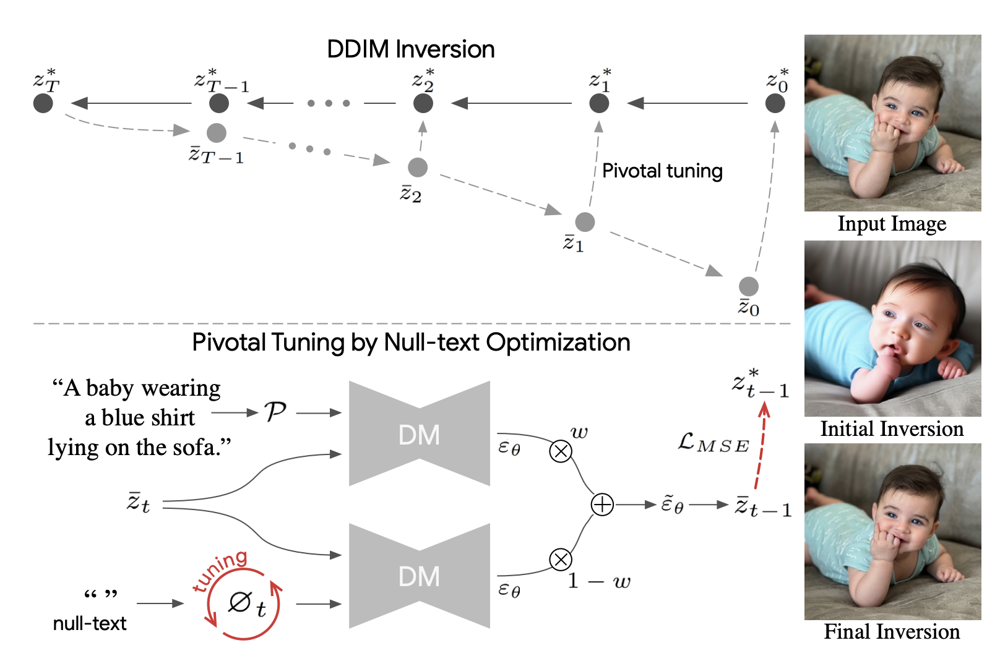
А само редактирование идет через промт ту промт метод

#### [Cross-Image Attention for Zero-Shot Appearance Transfer](https://arxiv.org/abs/2311.03335)

https://disk.yandex.ru/i/7O8Ei7z1-qyMyw

Без обучения и файтюнинга. Используюя тектстовую информацию и и семантику
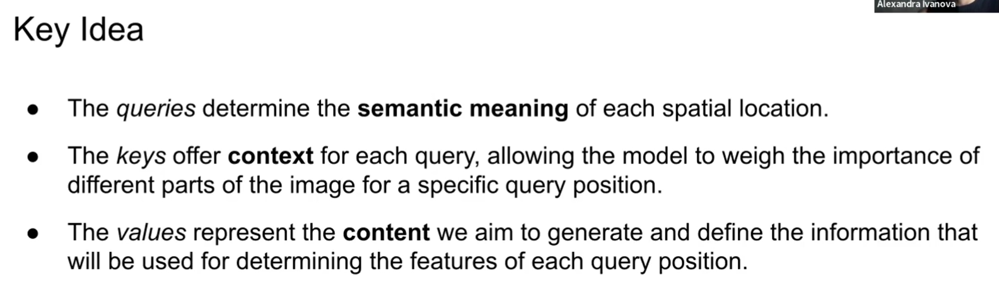
Мы работаем с конрасностью. Что бы в кросс атаншене не распыляться прям на все, а быть ближе к мапе селф этеншену
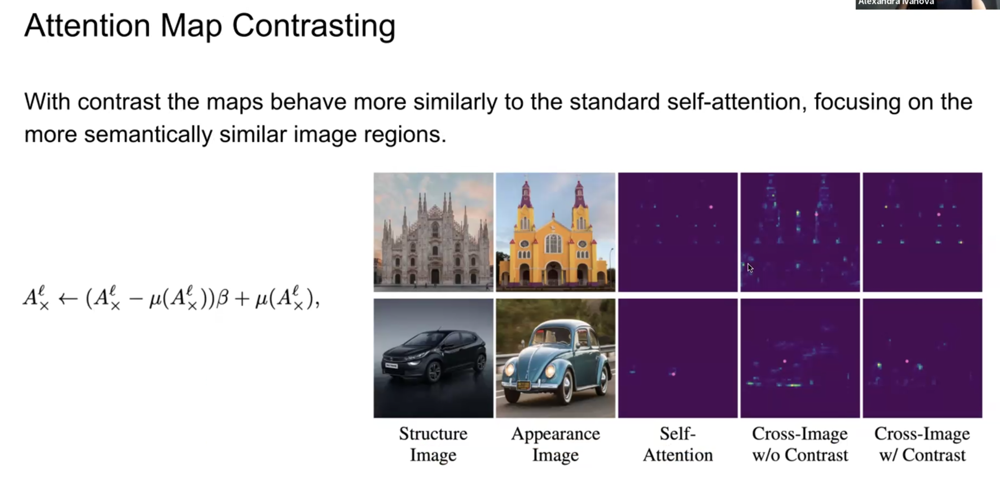
Appearance guidence. Сдвигаем шум от одной картинке к другой.
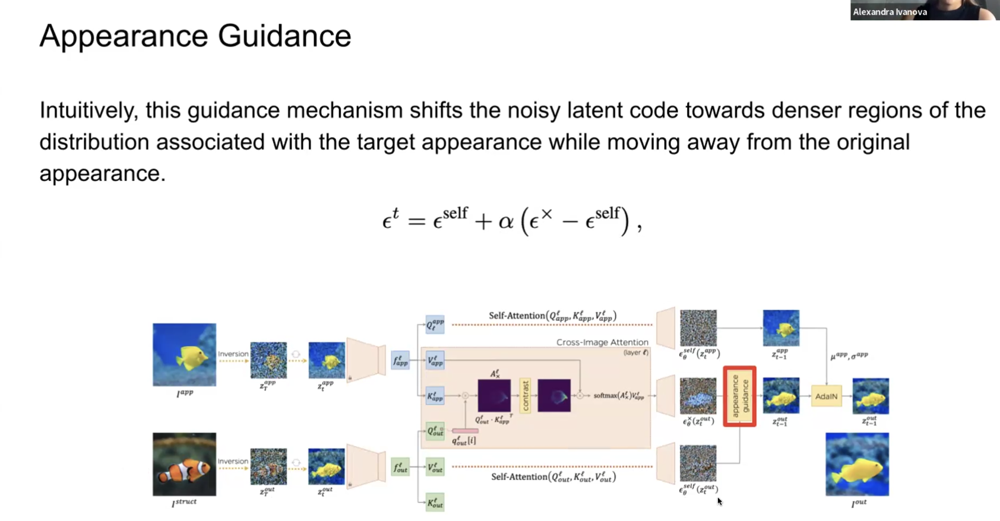

#### [TurboEdit: Instant text-based image editing](https://arxiv.org/pdf/2408.08332)

Ттренят свою нейронку F 8дней А100 которая выдает шум. И затем по умному делают инверсинг и затем едитинг при расшумлении поэтапно
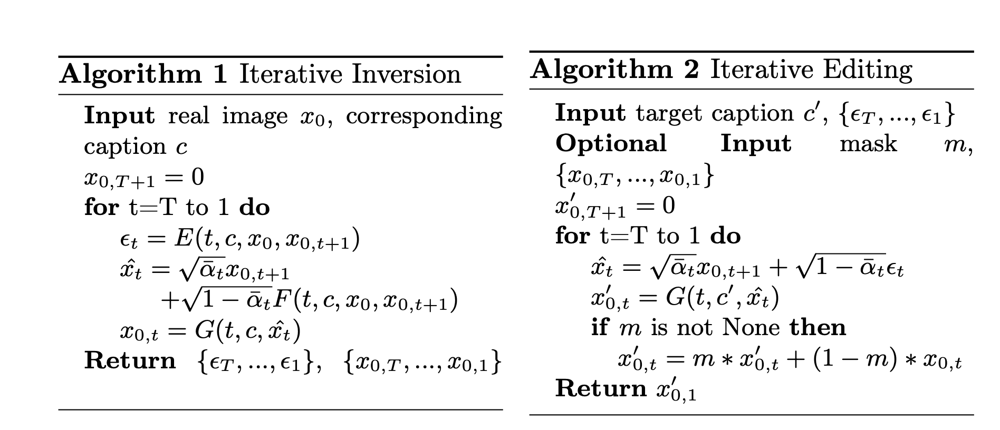
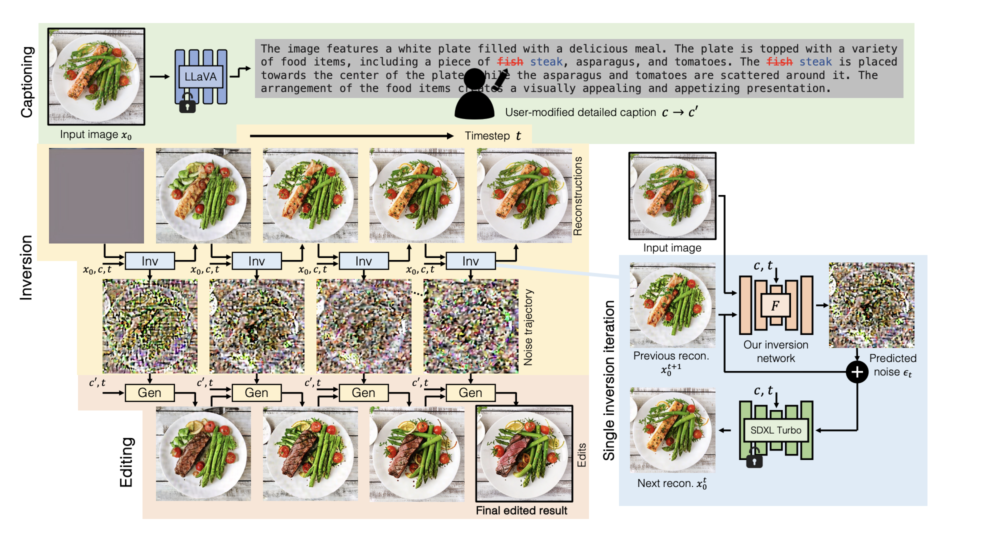

Идея статьи генерить одинаково стилистичесие изображения. Поэтому они придумывают считать этеншен с передацей ключей и значений уже сгенереных картинок (всех плохо, они выбирают только одну). То есть они расширяют ключи изначаения генерируемого изобрвжения уже теми что готовы, что бы забрать информацию и структуру. Дополнительно что бы улучшить генерацию они добавляю адаин на с уже сгенерированной картинкой, что бы забрать статистики из уже готового стиля (адаин часто используется  взадаче переноса стиля)
https://disk.yandex.ru/i/GT5mwvVLUtqnqA
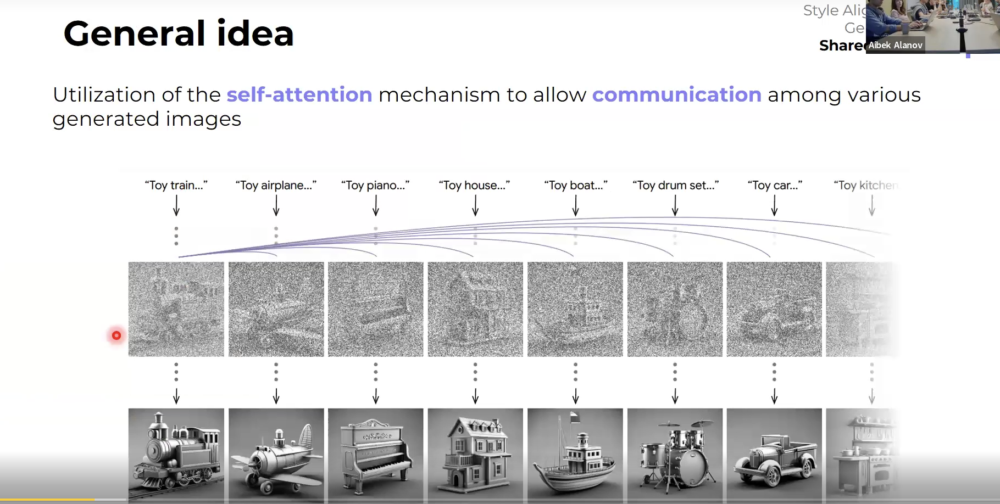
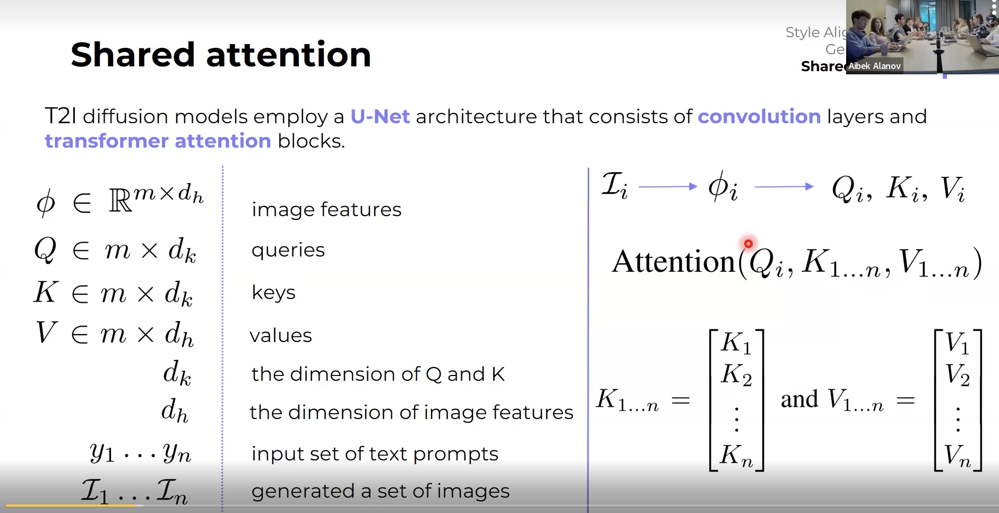
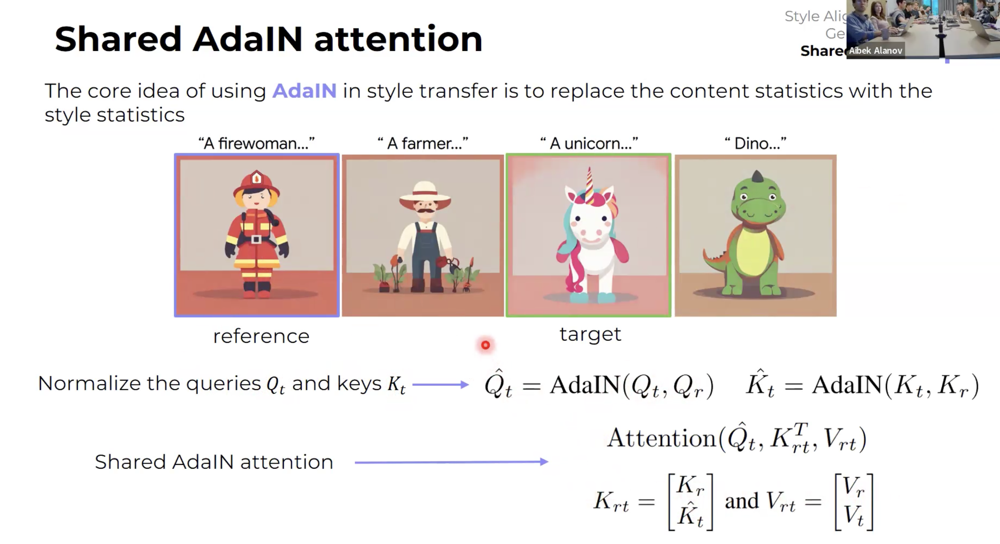

#### [An Edit Friendly DDPM Noise Space: Inversion and Manipulations](https://arxiv.org/abs/2304.06140)

Не особо понял прикол. Там что то с сохранем. Делают более быструю инверсию или типа тогою

#### [MasaCtrl](https://arxiv.org/abs/2304.08465)

Суть статьи что они работают с нонриджит трансформациями (изменение поз и т.д. В соновном работа с заменами селф эттеншена, только на конечных этапах семплирования и только в части декодера юнета, обьясняют что на начальном этапе там структура строится и менять ничего не надо, и по декодеру показывают маски декодера, что типа там формирование идет поз и типа того.

Дополнительно они еще с масками работают беря маски этеншенов для бекграунда и изменяемого обьекта. И их смешивают и подмешивают при семплировании
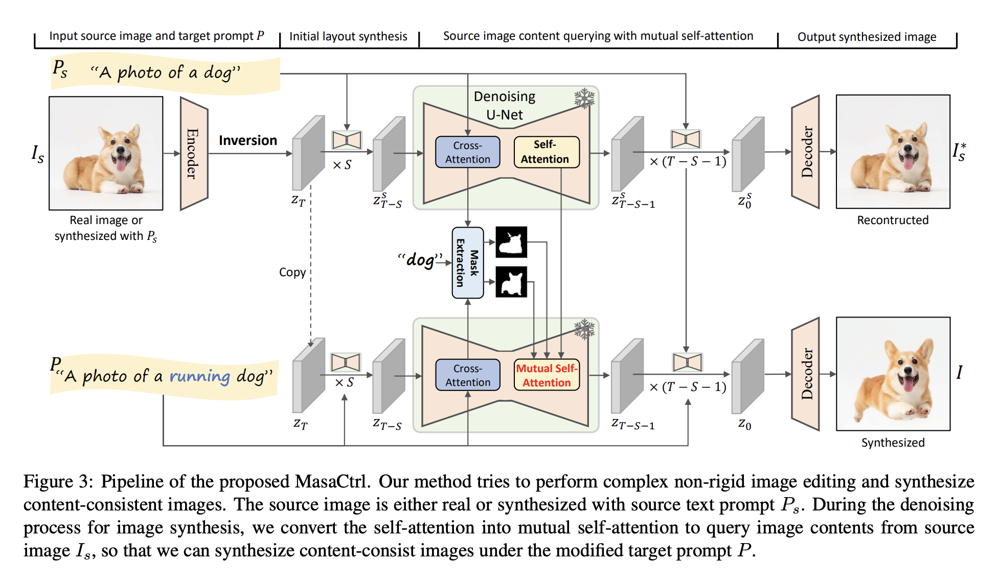
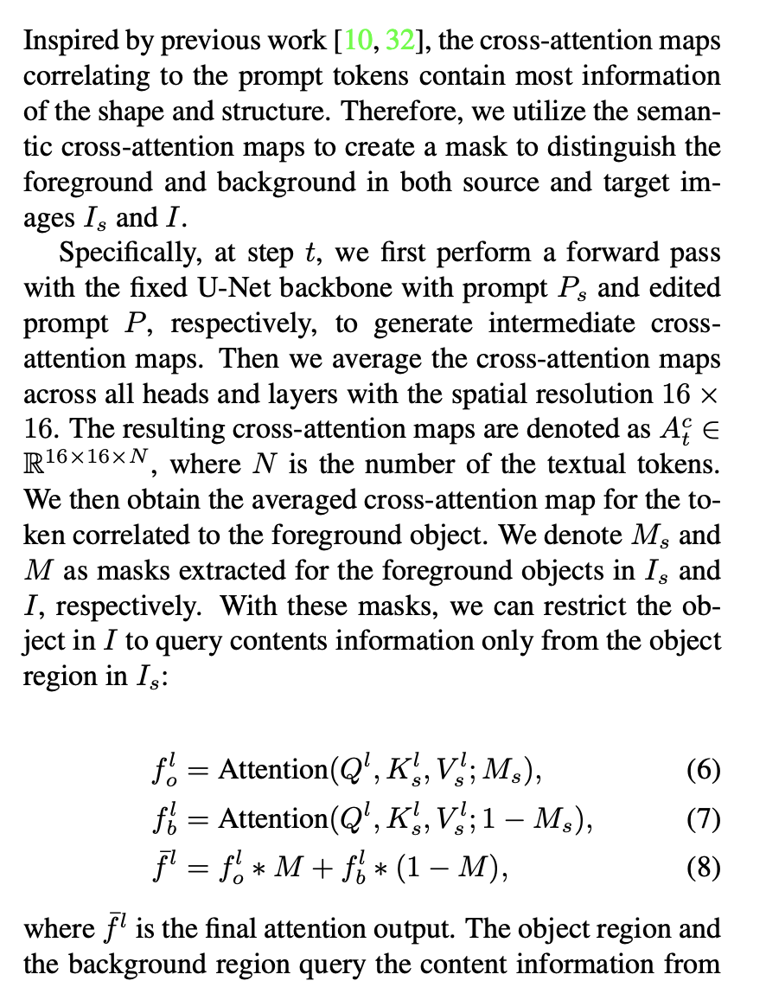

#### [PostEdit: Posterior Sampling for Efficient Zero-Shot Image Editing](https://arxiv.org/abs/2410.04844)

Завели динамику ланджевена для редактирование. Там по сути просмотр разницы шумов, потом его добавление как ланджевеном или типа того. Идея что бы сдвигать семплинг в сторону базовой картинки, что бы различиц с редактируемой не было
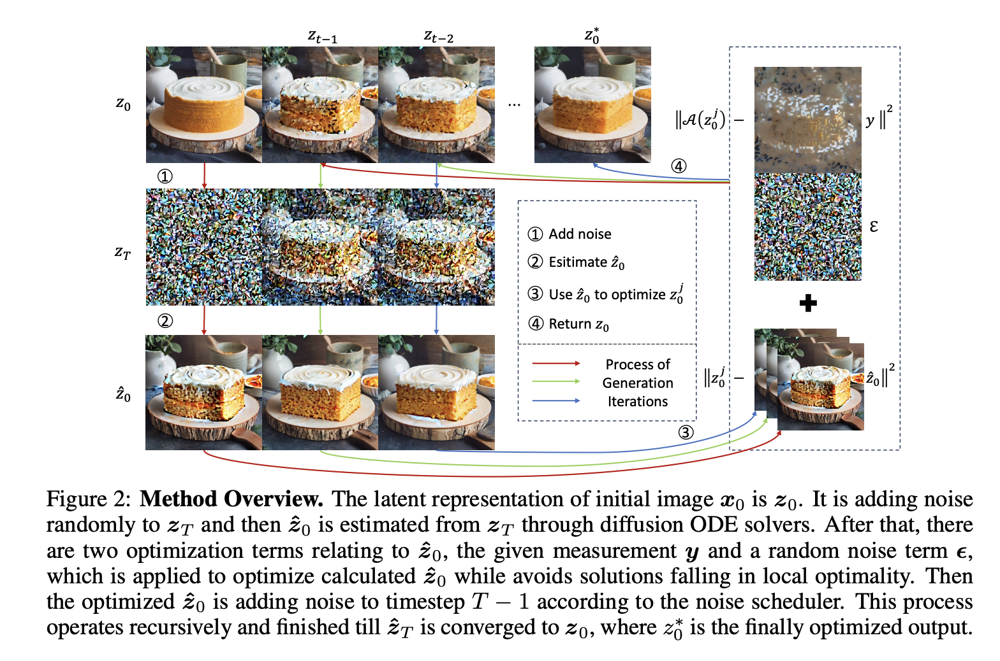

#### [KV-Edit: Training-Free Image Editing for Precise Background Preservation](https://arxiv.org/abs/2502.17363)

Прикол редактирования для дит трансформеров. Но вроде заводится и для обычных диффузионных моделях на юнете

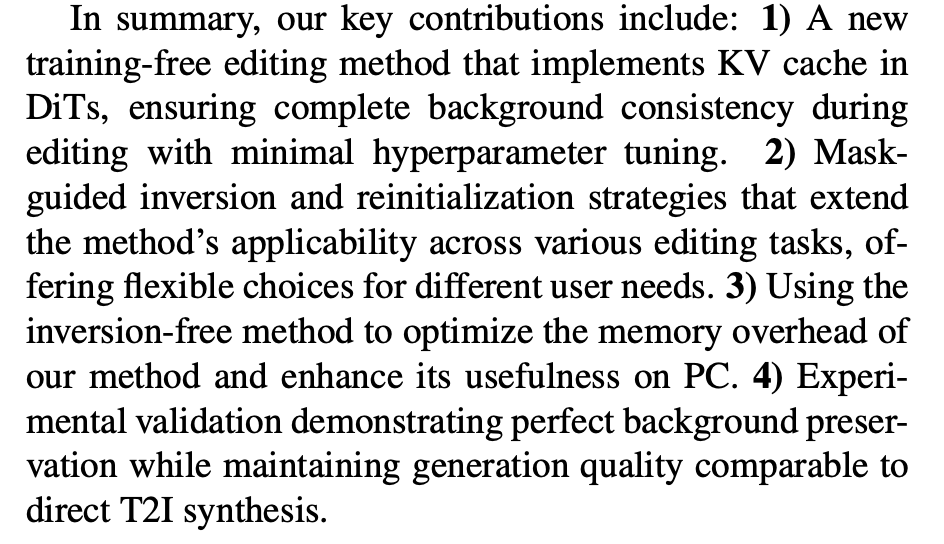
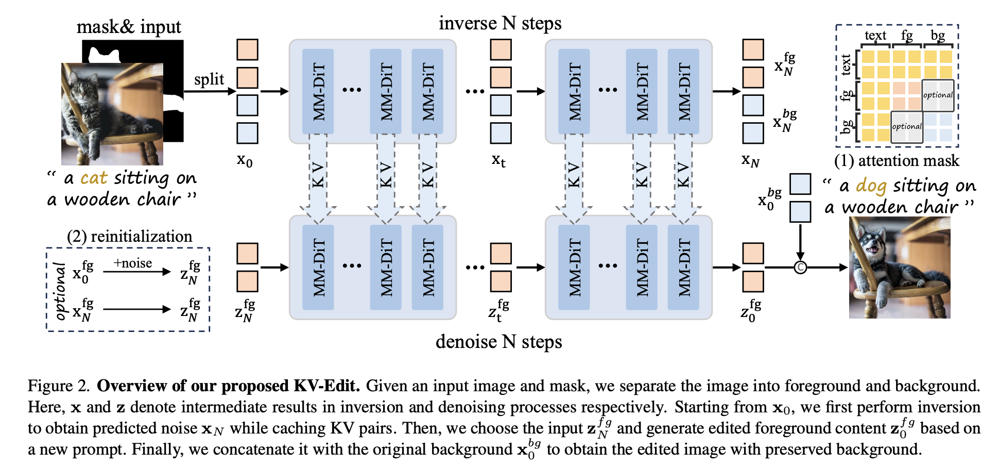

Замечают что проблема в том что в юнете генериться сразу все и не разделяется бек и фронт. В дите мы можем вытащить информацию чисто бек токенов и фронт токенов и тем самым более точно влиять на редактирование. Типа в кваери использовать запросы чисто по фронту который хотим менять, тем самым генерируя фронт и потом просто соединять это измененное с бекграундом

Moreover, directly generating foreground tokens often
results in discontinuous or incorrect content relative to the
background. Therefore, we propose a new attention mechanism where queries contain only foreground information,
while keys and values incorporate both foreground and background information. Excluding text tokens, the imagemodality self-attention computation can be expressed as:

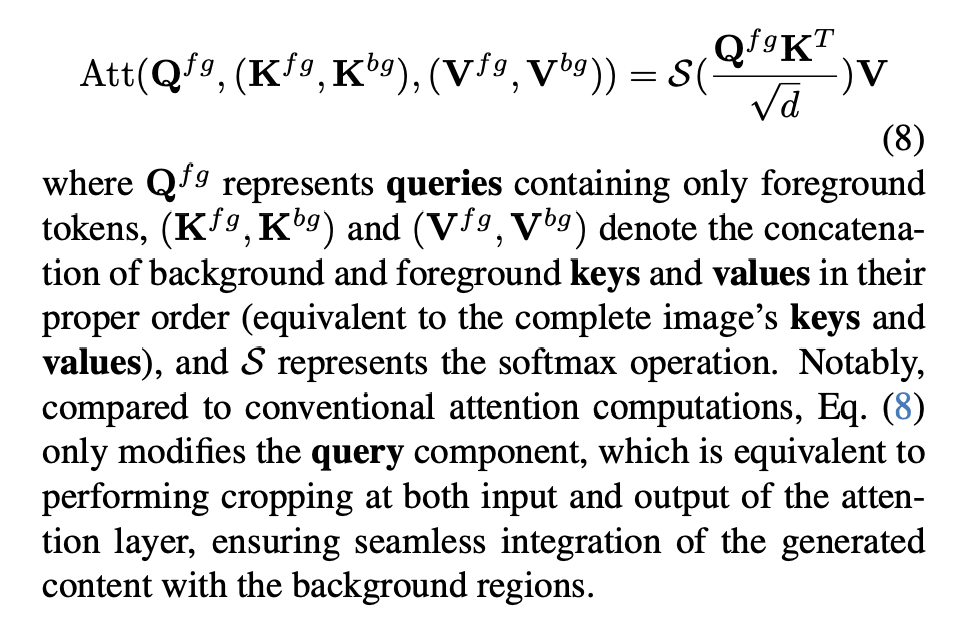

Что происходит в этом тексте:
🧠 Основная идея:
Фон можно сохранить, если запомнить, как он был "пройден" моделью в процессе генерации изображения — от шума к финальной картинке. Модель проходит через много слоёв и шагов, и на каждом шаге формируются специальные данные, называемые key-value пары (KV) в self-attention механизме.

📦 Что они делают:
Во время инверсии (то есть превращения картинки обратно в шум, чтобы её потом редактировать), они сохраняют эти key-value пары, которые соответствуют фону.

Потом, когда они снова запускают генерацию картинки с новым передним планом, они подставляют эти сохранённые KV-пары для фоновых токенов.

А передний план заново генерируется, как обычно.

Они называют этот процесс KV-Edit.
Чем это отличается от других методов?
Многие другие методы просто подставляют всю старую картинку на каком-то этапе — это грубый способ.

Здесь же фон воспринимается как контекст, как если бы это был контекст в языковой модели (типа GPT), и повторно не генерируется.

Это позволяет добиться идеального совпадения фона — он не "плавает", не искажается, не меняется.
Пример аналогии:
Представь, что ты написал текст и хочешь заменить одно предложение, не меняя остальное. Ты просто оставляешь старый текст как контекст и редактируешь нужную часть. Вот так и здесь — фон "оставляют", а передний план перерисовывают.


Previous works [9, 12, 16] often fail in object removal
tasks when using image captions as guidance, as the original object still aligns with the target prompt. Through our
in-depth analysis, we reveal that this issue stems from the
residual information of the original object, which persists
both in its own tokens and propagates to surrounding tokens through attention mechanisms, ultimately leading the
model to reconstruct the original content. (здесь говорят что раньше у моделей были проблемы с редактированием удалением, так как они подавали промт как контекст, и в этеншенах бекграунда так же сохранялась информация об обьекте, поэтому проблемы возникали)

🧩 Проблема:
Когда другие методы пытаются удалить объект с картинки (например, убрать собаку с травы), модель всё равно его рисует, даже если в текстовом описании ("prompt") этого объекта больше нет.

Почему это происходит?
Даже если ты убрал упоминание объекта в тексте, его "следы" остались в скрытых представлениях.

Эти следы:

Присутствуют в токенах, которые соответствуют этому объекту.

Через механизм внимания (attention) они распространяются на соседние области изображения.

В итоге — модель думает: “Наверное, этот объект всё ещё должен быть здесь”, и рисует его снова.

🔧 Что авторы делают, чтобы это исправить:
Они предлагают два трюка для лучшего удаления объектов:

🛠 1. Мешаем исходную информацию — “fused noise”:
После инверсии (когда из картинки получили её скрытое представление ztN), они заменяют его смесью:

Copy
z′tN = noise * tN + ztN * (1 - tN)
Это значит:

Берётся немного шума, и немного оригинального содержимого.

Итог — размытие или “сбивание” информации о том, что было в оригинале, особенно в местах, где tN ближе к 1.

🛡 2. Attention mask во время инверсии:
Во время инверсии они не позволяют переднему плану участвовать в формировании KV-пар (ключей и значений).

То есть модель не запоминает данные про те области, где был удаляемый объект.

Это снижает вероятность того, что модель потом “вспомнит” и восстановит удалённый объект.

📈 Результат:
Эти методы — опциональные (их можно включать при необходимости) — повышают качество редактирования, особенно в сложных случаях, когда надо удалить что-то полностью и незаметно.

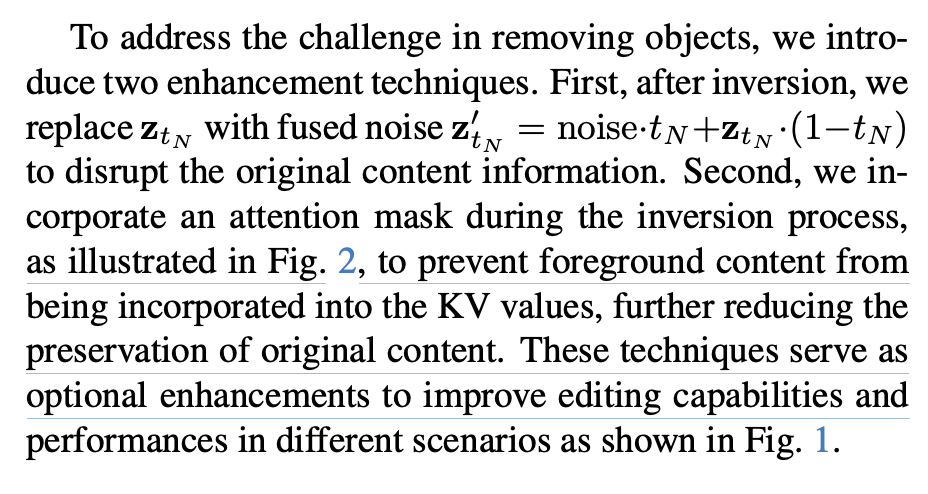

#### [Vision-guided and Mask-enhanced Adaptive Denoising for Prompt-based Image Editing](https://arxiv.org/abs/2410.10496)

По сути они
1) через апи адаптер в этеншены подмешивают вектор изменения между сорсом и таргетом (там есть формула). Есть картинки показывающие что через такое можно даже редактировать (понятно что без консистентности)
2) они по умному делают маски, работу с эттеншенами. Т.е кроме обычного кросс етеншена где связь текст и область, они потом прыгают на селф этеншены и смотрят связи патчей между собой (области изображений) и тем самым уточняют область редактирования
3) после уточненной маски они при семплинге добавляют не равномерный шум на картинку, а опредленной области больше, при чем как будто не чисто маске (как в других статьях), а еще дополнительно более жесче берут трешхолд и сильнее урезают маску. Типа при смене кота на собаку, к лицу кота нужно блольше шума добавлять. Так как там тяжелее редактирование
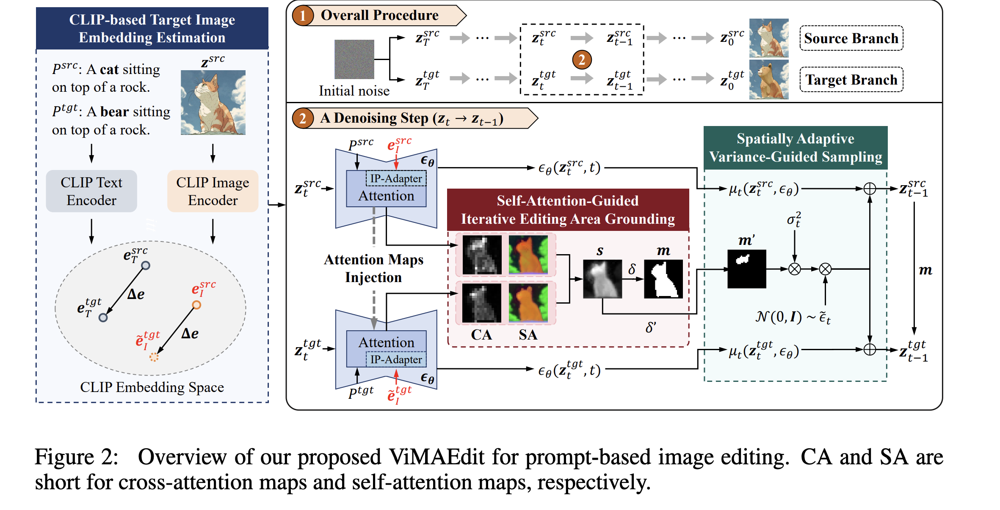

#### [Tuning-Free Image Editing with Fidelity andEditability via Unified Latent Diffusion Model](https://arxiv.org/abs/2504.05594)
По сути они говорят что работа с этеншенами плоха. И предлагаю твариант гайдера на этеншен слои. То есть на каждом шаге, они запускают оптимизацю этеншенов на определенном лоссе, делая этеншены редактируемоц ветки ближе к этеншенам оригинальной картинки. Тем самым повышая фидельти и едитабилити. Кода нет, но получают какие-то неплохие результаты

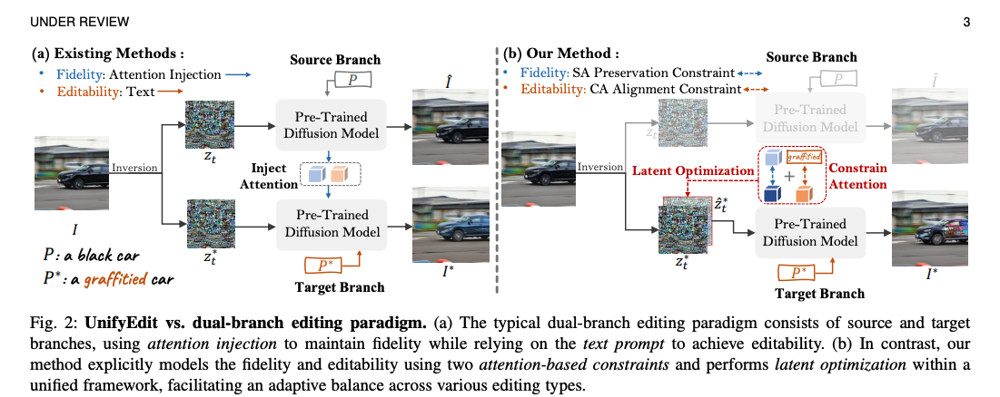
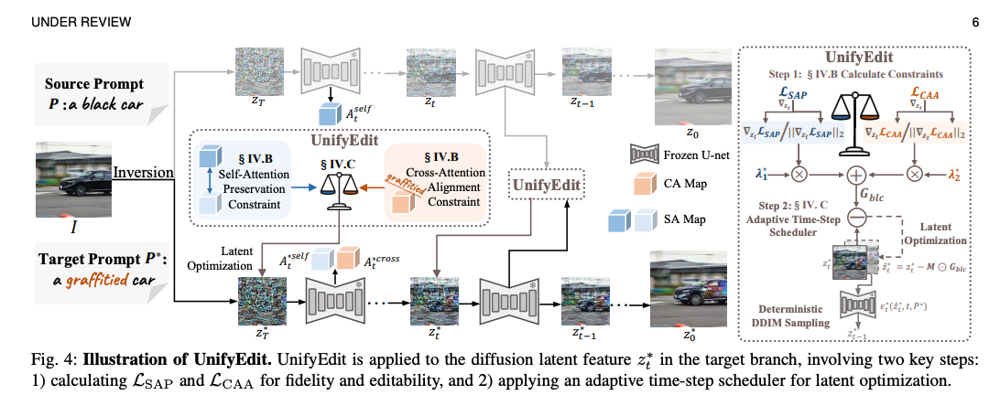

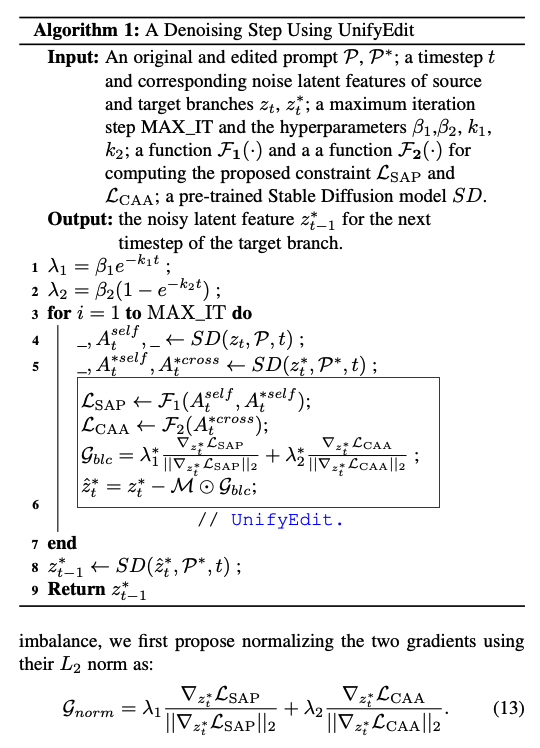

#### [DiffEdit: Diffusion-based semantic image editing with mask guidance](https://arxiv.org/abs/2210.11427)
По сути они маскируют область редактирования и потом при расшумлении добавляя информацию текстом и инфу изначальног изображения семплят и в маскируемой области получают реадктирование. По сути типа блендинга. Можно использовать код получения маски или типа того

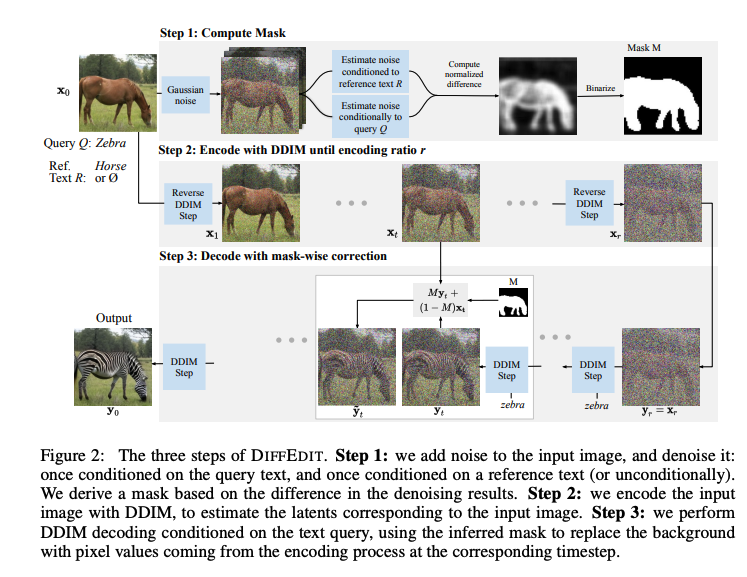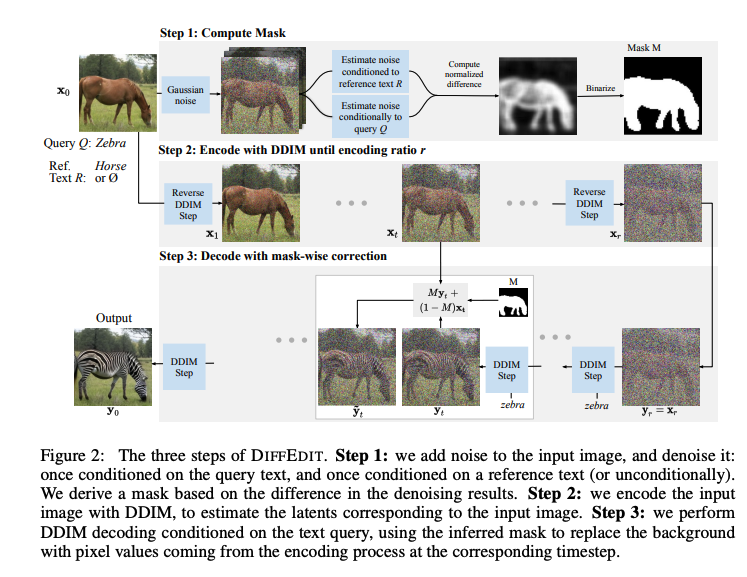
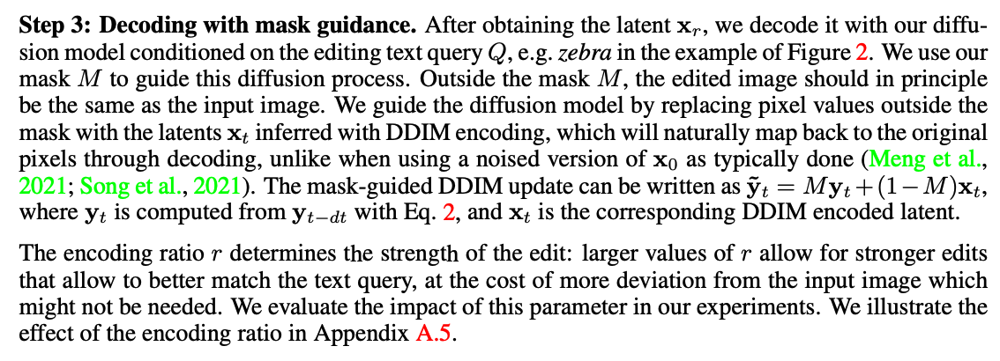

#### [Towards Understanding Cross and Self-Attention in Stable Diffusion for Text-Guided Image Editing](https://arxiv.org/abs/2403.03431)

Они расматривают реадктирование через промты. Расписывают код этеншенов. Более глубоко смотрят на работу с этеншенами и предлагают свой вариант

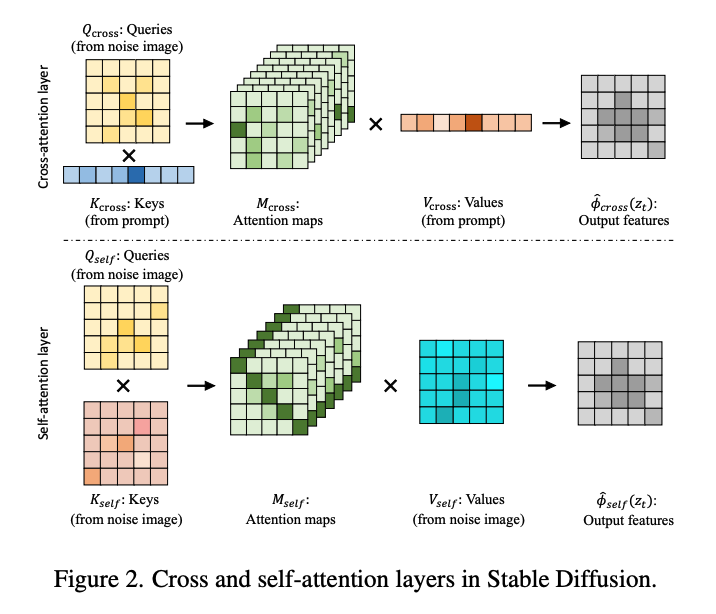

Вот формула кроссетеншена

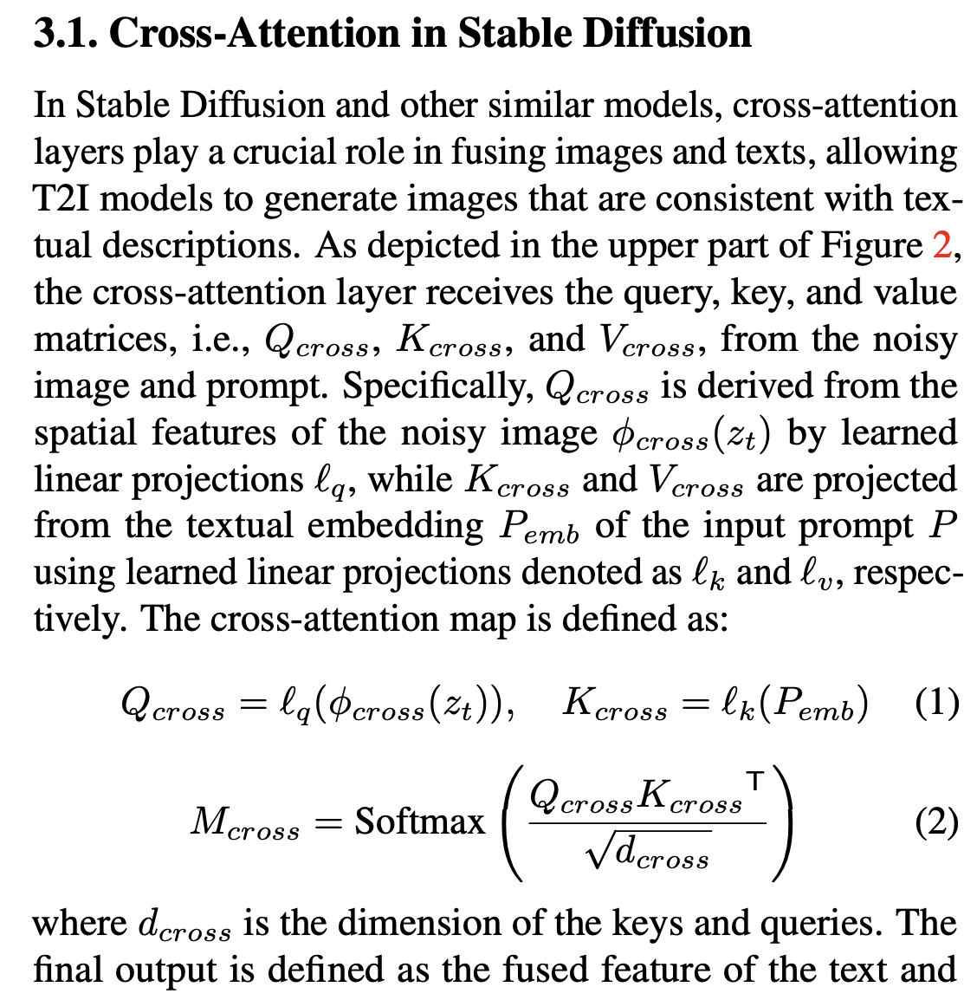
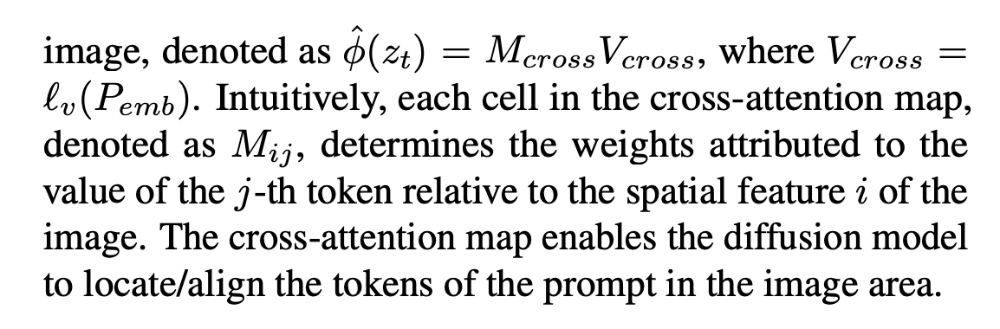
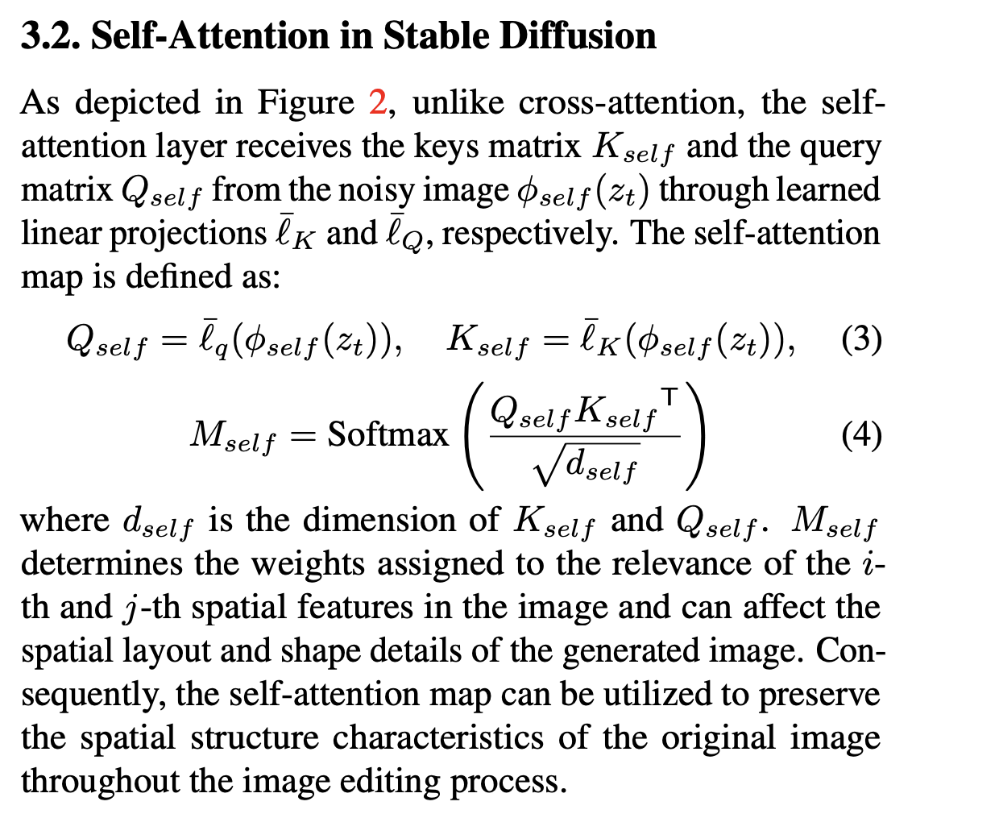

#### []()

## Attention articals

[Как вписаны этеншены в блоки юнета диффузионных моделей](https://github.com/huggingface/diffusion-models-class/tree/main/unit3)

### Attention Is All You Need

https://arxiv.org/abs/1706.03762

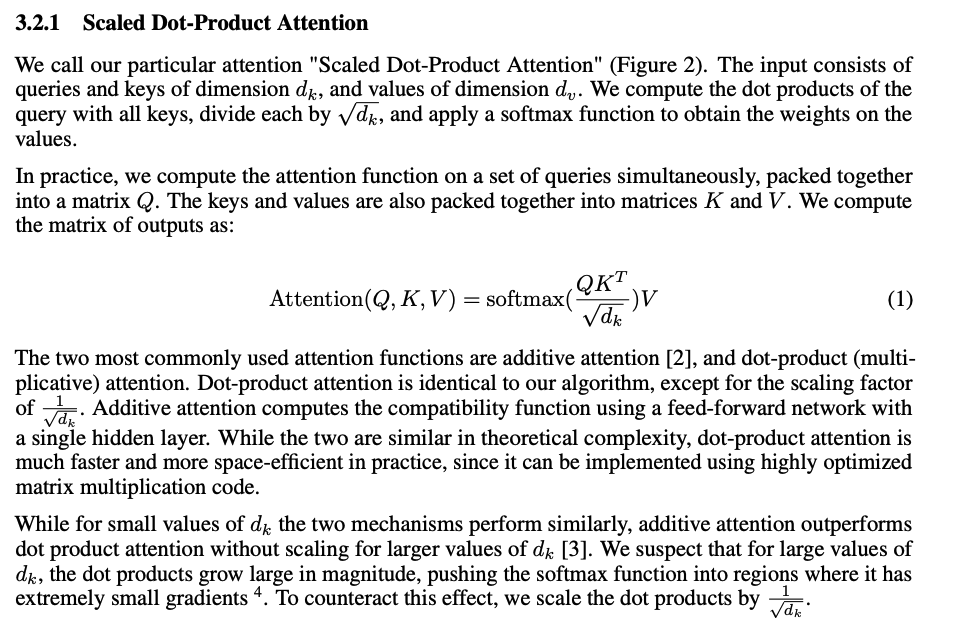

### Self attantion and cross attantion

https://www.linkedin.com/posts/damienbenveniste_what-is-the-difference-between-self-attention-activity-7211029906166624257-m0Wn?utm_source=share&utm_medium=member_desktop&rcm=ACoAADWD5UYBCkt5iIB_XO8MR7-QL-kjb3HFUEo
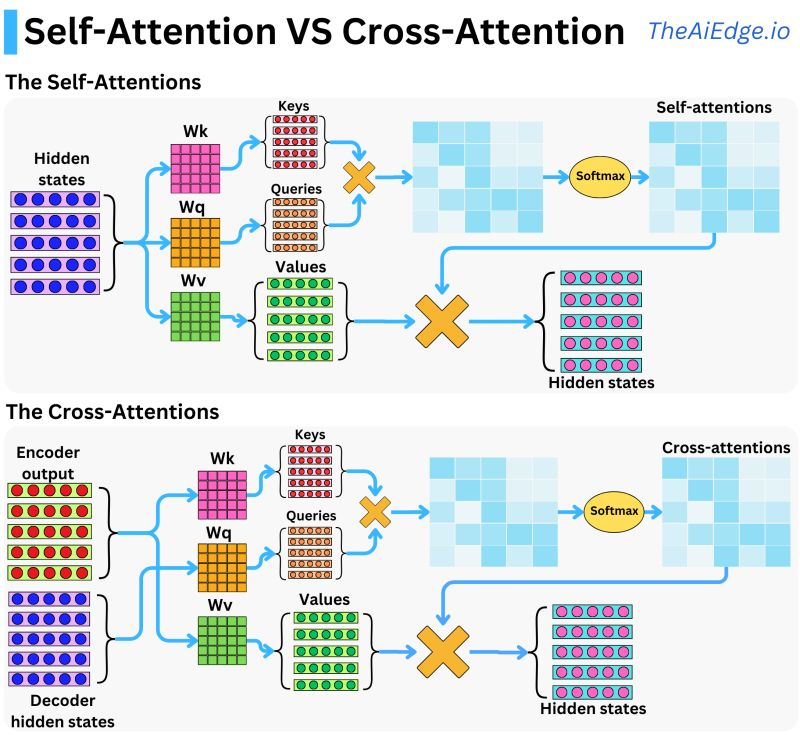

### Understanding and Coding the Self-Attention Mechanism of Large Language Models From Scratch

https://sebastianraschka.com/blog/2023/self-attention-from-scratch.html?utm_referrer=https://dzen.ru/media/id/5e048b1b2b616900b081f1d9/64f71a85d60cda47f1705018

##### Self-Attention

In [2]:
sentence = 'Life is short, eat dessert first'

dc = {s:i for i,s in enumerate(sorted(sentence.replace(',', '').split()))}
print(dc)

{'Life': 0, 'dessert': 1, 'eat': 2, 'first': 3, 'is': 4, 'short': 5}


In [3]:
import torch

sentence_int = torch.tensor([dc[s] for s in sentence.replace(',', '').split()])
print(sentence_int)

tensor([0, 4, 5, 2, 1, 3])


In [7]:
torch.manual_seed(123)
embed = torch.nn.Embedding(6, 16)
embedded_sentence = embed(sentence_int).detach()

print(embedded_sentence)
print("X:", embedded_sentence.shape)

tensor([[ 0.3374, -0.1778, -0.3035, -0.5880,  0.3486,  0.6603, -0.2196, -0.3792,
          0.7671, -1.1925,  0.6984, -1.4097,  0.1794,  1.8951,  0.4954,  0.2692],
        [ 0.5146,  0.9938, -0.2587, -1.0826, -0.0444,  1.6236, -2.3229,  1.0878,
          0.6716,  0.6933, -0.9487, -0.0765, -0.1526,  0.1167,  0.4403, -1.4465],
        [ 0.2553, -0.5496,  1.0042,  0.8272, -0.3948,  0.4892, -0.2168, -1.7472,
         -1.6025, -1.0764,  0.9031, -0.7218, -0.5951, -0.7112,  0.6230, -1.3729],
        [-1.3250,  0.1784, -2.1338,  1.0524, -0.3885, -0.9343, -0.4991, -1.0867,
          0.8805,  1.5542,  0.6266, -0.1755,  0.0983, -0.0935,  0.2662, -0.5850],
        [-0.0770, -1.0205, -0.1690,  0.9178,  1.5810,  1.3010,  1.2753, -0.2010,
          0.4965, -1.5723,  0.9666, -1.1481, -1.1589,  0.3255, -0.6315, -2.8400],
        [ 0.8768,  1.6221, -1.4779,  1.1331, -1.2203,  1.3139,  1.0533,  0.1388,
          2.2473, -0.8036, -0.2808,  0.7697, -0.6596, -0.7979,  0.1838,  0.2293]])
X: torch.Size([6, 16]

In [39]:
torch.manual_seed(123)

d = embedded_sentence.shape[1]

d_q, d_k, d_v = 24, 24, 28

W_query = torch.nn.Parameter(torch.rand(d_q, d))
W_key = torch.nn.Parameter(torch.rand(d_k, d))
W_value = torch.nn.Parameter(torch.rand(d_v, d))
print("W_value:", W_value.shape)

W_value: torch.Size([28, 16])


In [40]:
x_2 = embedded_sentence[1]

query_2 = W_query.matmul(x_2)
key_2 = W_key.matmul(x_2)
value_2 = W_value.matmul(x_2)

print("x_2:", x_2.shape)
print("query_2:", query_2.shape)
print("key_2:",key_2.shape)
print("value_2:",value_2.shape)

x_2: torch.Size([16])
query_2: torch.Size([24])
key_2: torch.Size([24])
value_2: torch.Size([28])


In [37]:
#  это через матричное умножение, полкчение сразу всех векторов, для всех слов сентенса
query = W_query.matmul(embedded_sentence.T).T
keys = W_key.matmul(embedded_sentence.T).T
values = W_value.matmul(embedded_sentence.T).T

print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

keys.shape: torch.Size([6, 24])
values.shape: torch.Size([6, 28])


In [43]:
# ненормированный вес для запроса слова 2 к ключу 4
omega_24 = query_2.dot(keys[4])
print(omega_24)

tensor(11.1466, grad_fn=<DotBackward0>)


In [45]:
# через матрицу ко всем ключам
omega_2 = query_2.matmul(keys.T)
print(omega_2)

tensor([ 8.5808, -7.6597,  3.2558,  1.0395, 11.1466, -0.4800],
       grad_fn=<SqueezeBackward4>)


In [46]:
# номрирование
import torch.nn.functional as F

attention_weights_2 = F.softmax(omega_2 / d_k**0.5, dim=0)
print(attention_weights_2)

tensor([0.2912, 0.0106, 0.0982, 0.0625, 0.4917, 0.0458],
       grad_fn=<SoftmaxBackward0>)


In [51]:
context_vector_2 = attention_weights_2.matmul(values)

print(attention_weights_2.shape)
print(values.shape)
print(context_vector_2.shape)
print(context_vector_2)

torch.Size([6])
torch.Size([6, 28])
torch.Size([28])
tensor([-1.5993,  0.0156,  1.2670,  0.0032, -0.6460, -1.1407, -0.4908, -1.4632,
         0.4747,  1.1926,  0.4506, -0.7110,  0.0602,  0.7125, -0.1628, -2.0184,
         0.3838, -2.1188, -0.8136, -1.5694,  0.7934, -0.2911, -1.3640, -0.2366,
        -0.9564, -0.5265,  0.0624,  1.7084], grad_fn=<SqueezeBackward4>)


In [49]:
values.shape

torch.Size([6, 28])

#### Multi-Head Attention

In [54]:
h = 3
multihead_W_query = torch.nn.Parameter(torch.rand(h, d_q, d))
multihead_W_key = torch.nn.Parameter(torch.rand(h, d_k, d))
multihead_W_value = torch.nn.Parameter(torch.rand(h, d_v, d))
multihead_W_value.shape

torch.Size([3, 28, 16])

In [55]:
multihead_query_2 = multihead_W_query.matmul(x_2)
print(multihead_query_2.shape)

torch.Size([3, 24])


In [56]:
multihead_key_2 = multihead_W_key.matmul(x_2)
multihead_value_2 = multihead_W_value.matmul(x_2)

In [96]:
stacked_inputs = embedded_sentence.T.repeat(3, 1, 1)
print(stacked_inputs.shape)

torch.Size([3, 16, 6])


In [97]:
multihead_keys = torch.bmm(multihead_W_key, stacked_inputs)
multihead_values = torch.bmm(multihead_W_value, stacked_inputs)
print("multihead_keys.shape:", multihead_keys.shape)
print("multihead_values.shape:", multihead_values.shape)

multihead_keys.shape: torch.Size([3, 24, 6])
multihead_values.shape: torch.Size([3, 28, 6])


In [98]:
multihead_keys = multihead_keys.permute(0, 2, 1)
multihead_values = multihead_values.permute(0, 2, 1)
print("multihead_keys.shape:", multihead_keys.shape)
print("multihead_values.shape:", multihead_values.shape)

multihead_keys.shape: torch.Size([3, 6, 24])
multihead_values.shape: torch.Size([3, 6, 28])


In [99]:
multihead_omega_2 = multihead_query_2.matmul(multihead_keys)
print(omega_2)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (72x6 and 24x3)

In [84]:
(multihead_query_2 @ multihead_keys.T).shape

torch.Size([6, 3, 3])

In [87]:
multihead_query_2 @ multihead_keys

tensor([[[ -4.6998, -15.8777, -20.5870,  -9.2172,  -9.4817,  15.4494],
         [ -4.6211,  -0.8574, -24.4662,  -6.9085,  -4.5868,  23.2441],
         [ -6.3106,   8.2177,  12.2194,   8.0759,   2.1534,  -5.5698]],

        [[ 10.0815,   3.7914, -20.2564, -14.0807,  -4.5015,  15.9630],
         [  4.6162,   8.4063, -23.4371, -14.6130, -13.7417,  13.2370],
         [  0.9246, -14.5083,  13.1240,  -3.5708,   4.6327, -11.3191]],

        [[  9.5033,  11.6041, -15.0547, -13.7880, -12.2019,  15.5950],
         [  5.5354,   7.9537, -19.8211, -16.5261,  -4.5941,  11.4768],
         [  0.4722,  14.0731,   3.7612,   1.9591,   1.2152, -21.3313]]],
       grad_fn=<CloneBackward0>)

In [88]:
multihead_query_2.shape

torch.Size([3, 24])

In [ ]:
multihead_keys = torch.bmm(multihead_W_key, stacked_inputs)

In [92]:
stacked_inputs.shape

torch.Size([3, 16, 6])

#### Cross-Attention

In [102]:
torch.manual_seed(123)

d = embedded_sentence.shape[1]
print("embedded_sentence.shape:", embedded_sentence.shape)

d_q, d_k, d_v = 24, 24, 28

W_query = torch.rand(d_q, d)
W_key = torch.rand(d_k, d)
W_value = torch.rand(d_v, d)

x_2 = embedded_sentence[1]
query_2 = W_query.matmul(x_2)
print("query.shape", query_2.shape)

keys = W_key.matmul(embedded_sentence.T).T
values = W_value.matmul(embedded_sentence.T).T

print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

embedded_sentence.shape: torch.Size([6, 16])
query.shape torch.Size([24])
keys.shape: torch.Size([6, 24])
values.shape: torch.Size([6, 28])


In [103]:
embedded_sentence_2 = torch.rand(8, 16) # 2nd input sequence

keys = W_key.matmul(embedded_sentence_2.T).T
values = W_value.matmul(embedded_sentence_2.T).T

print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

keys.shape: torch.Size([8, 24])
values.shape: torch.Size([8, 28])
